In [2]:
# ============================================================
# CELL 1 — SETUP GPU, DRIVE, PATHS
# ============================================================

import os
import shutil
import random
from pathlib import Path

import torch

print("Torch:", torch.__version__)
print("CUDA:", torch.cuda.is_available())
!nvidia-smi

if not torch.cuda.is_available():
    raise RuntimeError("No GPU detected. Use Colab T4 GPU.")

from google.colab import drive
drive.mount("/content/drive")

DEVICE = 0
print("Using GPU:", torch.cuda.get_device_name(0))

BASE = Path("/content/drive/MyDrive/NUS-MTech/ISYS5004/PracticeProject")
SRC = BASE / "sushi_plate_annotation"

RUNS_DIR = BASE / "runs"
PRED_DIR = BASE / "predictions"
REPORT_DIR = BASE / "report_assets"

OUT_SEG = Path("/content/sushi_yolo_seg")
OUT_DET = Path("/content/sushi_yolo_det_recall")
OUT_DET_ALL = Path("/content/sushi_yolo_det_all")

for d in [RUNS_DIR, PRED_DIR, REPORT_DIR]:
    d.mkdir(parents=True, exist_ok=True)

print("BASE:", BASE)
print("SRC:", SRC)
print("SRC exists:", SRC.exists())

Torch: 2.10.0+cu128
CUDA: True
Sun May 17 01:32:38 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   40C    P8             13W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+----------------

In [3]:
# ============================================================
# CELL 2 — INSTALL PACKAGES
# ============================================================

!pip install -U ultralytics opencv-python matplotlib pandas pyyaml gradio -q

from ultralytics import YOLO
import ultralytics

print("Ultralytics:", ultralytics.__version__)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 37.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 112.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 116.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.7/19.7 MB 102.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 6.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 3.0.3 which is incompatible.
cudf-cu12 26.2.1 requires pandas<2.4.0,>=2.0, but you have pandas 3.0.3 which is incompatible.
bqplot 0.12.45 requires pandas<3.0.0,>=1.0.0, but you have pandas 3.0.3 which is inco

In [4]:
# ============================================================
# CELL 3 — AUTO-FIND IMAGE AND LABEL ROOTS
# ============================================================

from collections import Counter

image_exts = {".jpg", ".jpeg", ".png", ".JPG", ".JPEG", ".PNG", ".webp", ".bmp"}

search_base = SRC if SRC.exists() else BASE

all_images = [p for p in search_base.rglob("*") if p.suffix in image_exts]
all_labels = [p for p in search_base.rglob("*.txt")]

print("Images found:", len(all_images))
print("Labels found:", len(all_labels))

if len(all_images) == 0 or len(all_labels) == 0:
    print("Searching whole BASE...")
    all_images = [p for p in BASE.rglob("*") if p.suffix in image_exts]
    all_labels = [p for p in BASE.rglob("*.txt")]

print("Total images:", len(all_images))
print("Total labels:", len(all_labels))

if len(all_images) == 0:
    raise RuntimeError("No images found.")
if len(all_labels) == 0:
    raise RuntimeError("No txt labels found.")

image_parent_counts = Counter([p.parent for p in all_images])
label_parent_counts = Counter([p.parent for p in all_labels])

print("\nCandidate image roots:")
for parent, count in image_parent_counts.most_common(10):
    print(count, parent)

print("\nCandidate label roots:")
for parent, count in label_parent_counts.most_common(10):
    print(count, parent)

IMAGE_ROOT = image_parent_counts.most_common(1)[0][0]
LABEL_ROOT = label_parent_counts.most_common(1)[0][0]

print("\nSelected IMAGE_ROOT:", IMAGE_ROOT)
print("Selected LABEL_ROOT:", LABEL_ROOT)

print("\nExample images:", [p.name for p in sorted(IMAGE_ROOT.glob('*'))[:5]])
print("Example labels:", [p.name for p in sorted(LABEL_ROOT.glob('*.txt'))[:5]])

Images found: 44
Labels found: 45
Total images: 44
Total labels: 45

Candidate image roots:
44 /content/drive/MyDrive/NUS-MTech/ISYS5004/PracticeProject/sushi_plate_annotation/images

Candidate label roots:
44 /content/drive/MyDrive/NUS-MTech/ISYS5004/PracticeProject/sushi_plate_annotation/labels/train
1 /content/drive/MyDrive/NUS-MTech/ISYS5004/PracticeProject/sushi_plate_annotation

Selected IMAGE_ROOT: /content/drive/MyDrive/NUS-MTech/ISYS5004/PracticeProject/sushi_plate_annotation/images
Selected LABEL_ROOT: /content/drive/MyDrive/NUS-MTech/ISYS5004/PracticeProject/sushi_plate_annotation/labels/train

Example images: ['IMG_0308_frame_000001.jpg', 'IMG_0308_frame_000136.jpg', 'IMG_0309_frame_000002.jpg', 'IMG_0309_frame_000031.jpg', 'IMG_0310_frame_000053.jpg']
Example labels: ['IMG_0308_frame_000001.txt', 'IMG_0308_frame_000136.txt', 'IMG_0309_frame_000002.txt', 'IMG_0309_frame_000031.txt', 'IMG_0310_frame_000053.txt']


In [5]:
# ============================================================
# CELL 4 — BUILD CLEAN YOLO-SEG DATASET FROM ORIGINAL POLYGONS
# ============================================================

random.seed(42)

if OUT_SEG.exists():
    shutil.rmtree(OUT_SEG)

for split in ["train", "val"]:
    (OUT_SEG / "images" / split).mkdir(parents=True, exist_ok=True)
    (OUT_SEG / "labels" / split).mkdir(parents=True, exist_ok=True)

images = sorted([p for p in IMAGE_ROOT.rglob("*") if p.suffix in image_exts])
labels = sorted(LABEL_ROOT.rglob("*.txt"))

label_map = {p.stem: p for p in labels}

pairs = []
for img in images:
    lbl = label_map.get(img.stem)
    if lbl is not None:
        pairs.append((img, lbl))

print("Matched image-label pairs:", len(pairs))

if len(pairs) == 0:
    print("Example image stems:", [p.stem for p in images[:10]])
    print("Example label stems:", [p.stem for p in labels[:10]])
    raise RuntimeError("No matched image-label pairs.")

random.shuffle(pairs)

n_val = max(1, int(len(pairs) * 0.20))
val_pairs = pairs[:n_val]
train_pairs = pairs[n_val:]

print("Train pairs:", len(train_pairs))
print("Val pairs:", len(val_pairs))

for img, lbl in train_pairs:
    shutil.copy2(img, OUT_SEG / "images" / "train" / img.name)
    shutil.copy2(lbl, OUT_SEG / "labels" / "train" / f"{img.stem}.txt")

for img, lbl in val_pairs:
    shutil.copy2(img, OUT_SEG / "images" / "val" / img.name)
    shutil.copy2(lbl, OUT_SEG / "labels" / "val" / f"{img.stem}.txt")

yaml_text = f"""
path: {OUT_SEG}
train: images/train
val: images/val

names:
  0: sushi_plate_rim
"""

(OUT_SEG / "data.yaml").write_text(yaml_text)

print((OUT_SEG / "data.yaml").read_text())
print("Final train images:", len(list((OUT_SEG / "images/train").glob("*"))))
print("Final val images:", len(list((OUT_SEG / "images/val").glob("*"))))

Matched image-label pairs: 44
Train pairs: 36
Val pairs: 8

path: /content/sushi_yolo_seg
train: images/train
val: images/val

names:
  0: sushi_plate_rim

Final train images: 36
Final val images: 8


In [8]:
# ============================================================
# CELL 5 — BUILD IMPROVED FRONT-BAND DATASET FROM LABELLED ELLIPSES
# ============================================================

import shutil
from pathlib import Path
import cv2
import numpy as np

# Output dataset for derived usable front-rim boxes
OUT_DET = Path("/content/sushi_yolo_frontband_arc_crop_v2")

if OUT_DET.exists():
    shutil.rmtree(OUT_DET)

for split in ["train", "val"]:
    (OUT_DET / "images" / split).mkdir(parents=True, exist_ok=True)
    (OUT_DET / "labels" / split).mkdir(parents=True, exist_ok=True)

def clamp(x, lo=0.0, hi=1.0):
    return max(lo, min(hi, float(x)))

def parse_seg_line(line):
    """
    YOLO segmentation format:
    cls x1 y1 x2 y2 ... xn yn
    coordinates are normalised.
    """
    parts = line.strip().split()
    cls = parts[0]
    coords = list(map(float, parts[1:]))
    xs = coords[0::2]
    ys = coords[1::2]
    return cls, xs, ys

def get_stack_crop_from_labels(lines, margin_x=0.10, margin_y=0.12):
    """
    Crop around all labelled plates in one image.
    This keeps the target stack while reducing irrelevant background.
    """
    all_x = []
    all_y = []

    for line in lines:
        _, xs, ys = parse_seg_line(line)
        all_x.extend(xs)
        all_y.extend(ys)

    x1, x2 = min(all_x), max(all_x)
    y1, y2 = min(all_y), max(all_y)

    bw = max(1e-6, x2 - x1)
    bh = max(1e-6, y2 - y1)

    x1 = clamp(x1 - bw * margin_x)
    x2 = clamp(x2 + bw * margin_x)
    y1 = clamp(y1 - bh * margin_y)
    y2 = clamp(y2 + bh * margin_y)

    return x1, y1, x2, y2

def crop_image_by_norm(img_bgr, crop):
    h, w = img_bgr.shape[:2]
    x1, y1, x2, y2 = crop

    px1 = int(x1 * w)
    py1 = int(y1 * h)
    px2 = int(x2 * w)
    py2 = int(y2 * h)

    px1 = max(0, min(w - 1, px1))
    py1 = max(0, min(h - 1, py1))
    px2 = max(px1 + 1, min(w, px2))
    py2 = max(py1 + 1, min(h, py2))

    return img_bgr[py1:py2, px1:px2]

def norm_to_crop_norm(x, y, crop):
    cx1, cy1, cx2, cy2 = crop

    nx = (x - cx1) / max(1e-9, (cx2 - cx1))
    ny = (y - cy1) / max(1e-9, (cy2 - cy1))

    return clamp(nx), clamp(ny)

def seg_line_to_front_band_bbox_in_crop(
    line,
    crop,
    lower_arc_quantile=0.62,
    full_width_ratio=0.88,
    band_h_ratio=0.18,
    min_band_h=0.010,
    max_band_h=0.055,
    min_poly_w=0.025,
    min_output_w=0.08,
    max_output_h=0.12,
):
    """
    Derive usable front-band rim bbox from labelled ellipse/polygon.

    Human annotation:
        visible plate ellipse / contour.

    Derived model target:
        thin horizontal front-band bbox.

    Key correction:
        y-position comes from lower arc.
        x-span comes from stable full ellipse width, not tiny lower-arc fragments.
    """
    cls, xs, ys = parse_seg_line(line)

    pts = np.array(list(zip(xs, ys)), dtype=float)
    if len(pts) < 4:
        return None

    x_all = pts[:, 0]
    y_all = pts[:, 1]

    x_min, x_max = float(np.min(x_all)), float(np.max(x_all))
    y_min, y_max = float(np.min(y_all)), float(np.max(y_all))

    poly_w = max(1e-9, x_max - x_min)
    poly_h = max(1e-9, y_max - y_min)

    # Remove tiny annotation fragments.
    if poly_w < min_poly_w:
        return None

    # Use lower arc only to determine y-centre.
    y_threshold = np.quantile(y_all, lower_arc_quantile)
    lower_pts = pts[y_all >= y_threshold]

    if len(lower_pts) < 2:
        y_threshold = np.quantile(y_all, 0.55)
        lower_pts = pts[y_all >= y_threshold]

    if len(lower_pts) < 2:
        return None

    y_c = float(np.median(lower_pts[:, 1]))

    # Use full ellipse width for stable horizontal band.
    cx = (x_min + x_max) / 2
    target_w = poly_w * full_width_ratio

    x1 = clamp(cx - target_w / 2)
    x2 = clamp(cx + target_w / 2)

    # Thin band height.
    band_h = max(min_band_h, min(max_band_h, poly_h * band_h_ratio))

    y1 = clamp(y_c - band_h / 2)
    y2 = clamp(y_c + band_h / 2)

    # Convert original normalised coordinates to cropped-image normalised coordinates.
    x1c, y1c = norm_to_crop_norm(x1, y1, crop)
    x2c, y2c = norm_to_crop_norm(x2, y2, crop)

    if x2c <= x1c or y2c <= y1c:
        return None

    xc = (x1c + x2c) / 2
    yc = (y1c + y2c) / 2
    bwc = x2c - x1c
    bhc = y2c - y1c

    # Final sanity filters in cropped-image coordinates.
    if bwc < min_output_w:
        return None

    if bhc > max_output_h:
        return None

    if bwc <= 0 or bhc <= 0:
        return None

    return f"{cls} {xc:.6f} {yc:.6f} {bwc:.6f} {bhc:.6f}"

# Build derived dataset from OUT_SEG produced earlier.
for split in ["train", "val"]:
    img_dir = OUT_SEG / "images" / split
    lbl_dir = OUT_SEG / "labels" / split

    for img_path in img_dir.glob("*"):
        lbl_path = lbl_dir / f"{img_path.stem}.txt"

        if not lbl_path.exists():
            continue

        lines = [x.strip() for x in lbl_path.read_text().splitlines() if x.strip()]

        if len(lines) == 0:
            continue

        img_bgr = cv2.imread(str(img_path))
        if img_bgr is None:
            continue

        crop = get_stack_crop_from_labels(lines, margin_x=0.10, margin_y=0.12)
        crop_bgr = crop_image_by_norm(img_bgr, crop)

        out_img_path = OUT_DET / "images" / split / img_path.name
        cv2.imwrite(str(out_img_path), crop_bgr)

        out_lines = []

        for line in lines:
            bbox_line = seg_line_to_front_band_bbox_in_crop(
                line,
                crop,
                lower_arc_quantile=0.62,
                full_width_ratio=0.88,
                band_h_ratio=0.18,
                min_output_w=0.08,
            )

            if bbox_line is not None:
                out_lines.append(bbox_line)

        out_lbl_path = OUT_DET / "labels" / split / f"{img_path.stem}.txt"
        out_lbl_path.write_text("\n".join(out_lines))

yaml_text = f"""
path: {OUT_DET}
train: images/train
val: images/val

names:
  0: sushi_plate_front_rim_arc
"""

(OUT_DET / "data.yaml").write_text(yaml_text)

print((OUT_DET / "data.yaml").read_text())
print("Train images:", len(list((OUT_DET / "images/train").glob("*"))))
print("Val images:", len(list((OUT_DET / "images/val").glob("*"))))
print("Train labels:", len(list((OUT_DET / "labels/train").glob("*.txt"))))
print("Val labels:", len(list((OUT_DET / "labels/val").glob("*.txt"))))

for split in ["train", "val"]:
    n_boxes = 0
    empty_labels = 0

    for lbl in (OUT_DET / "labels" / split).glob("*.txt"):
        lines = [x for x in lbl.read_text().splitlines() if x.strip()]
        n_boxes += len(lines)
        if len(lines) == 0:
            empty_labels += 1

    print(f"{split} boxes:", n_boxes)
    print(f"{split} empty label files:", empty_labels)


path: /content/sushi_yolo_frontband_arc_crop_v2
train: images/train
val: images/val

names:
  0: sushi_plate_front_rim_arc

Train images: 36
Val images: 8
Train labels: 36
Val labels: 8
train boxes: 274
train empty label files: 0
val boxes: 64
val empty label files: 0


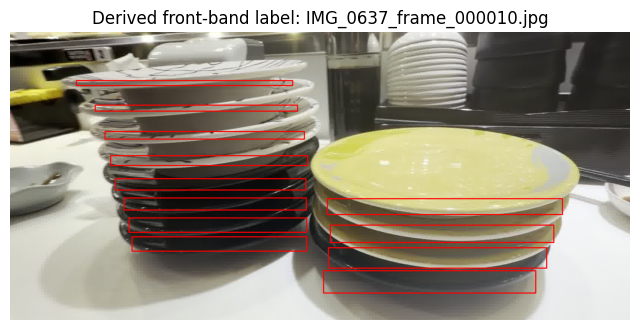

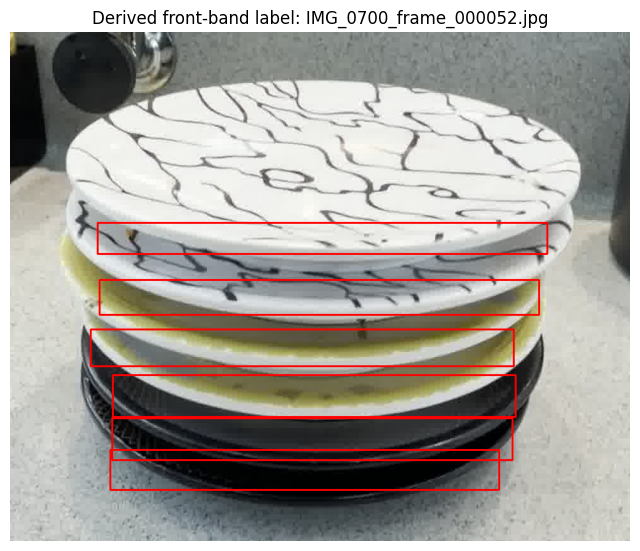

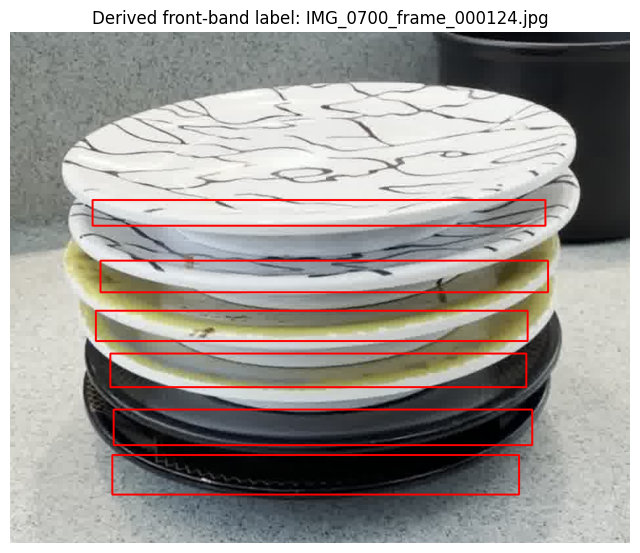

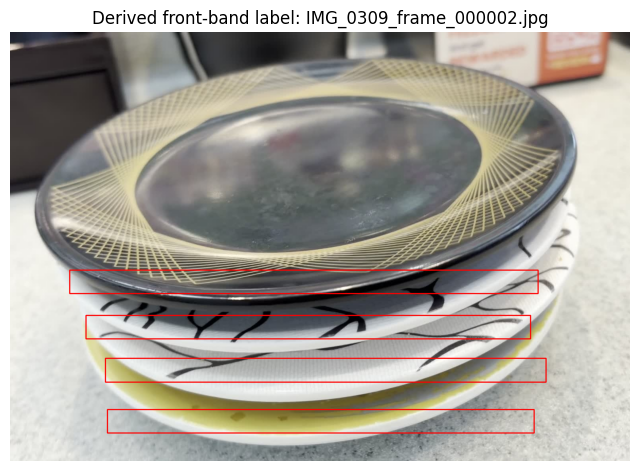

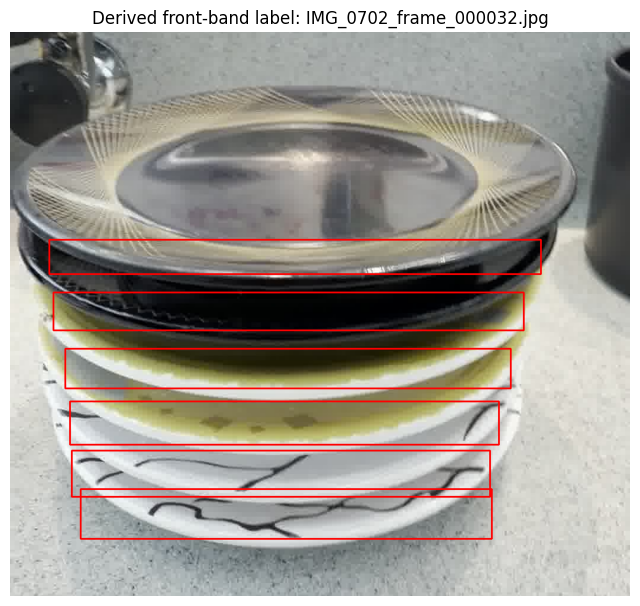

...

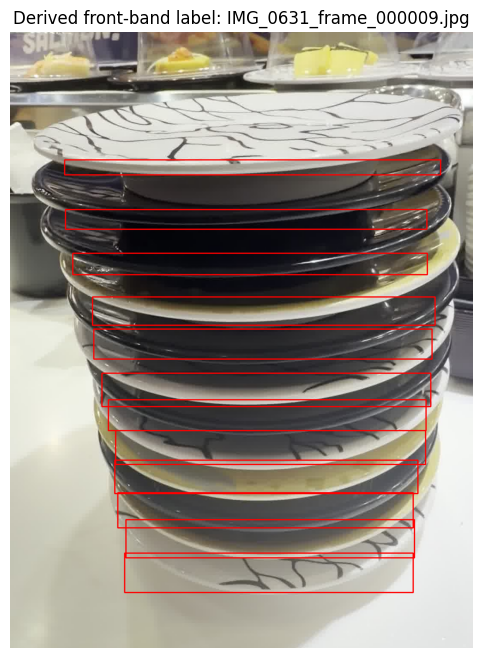

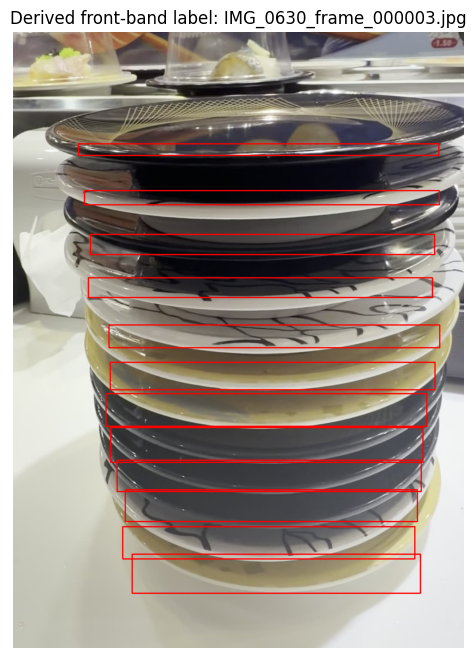

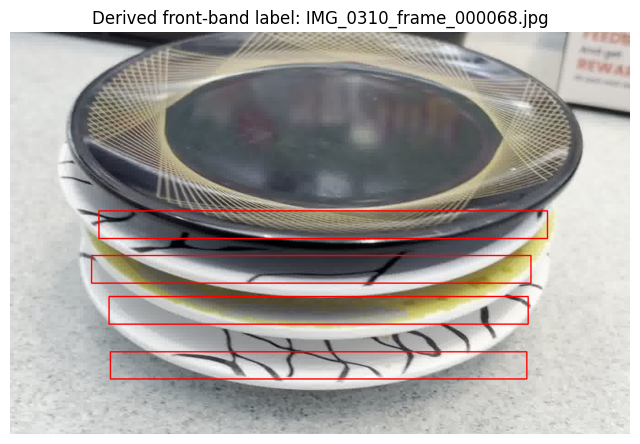

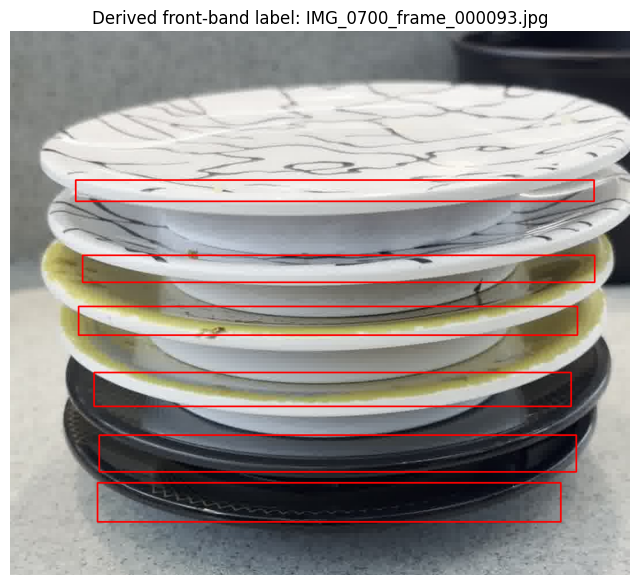

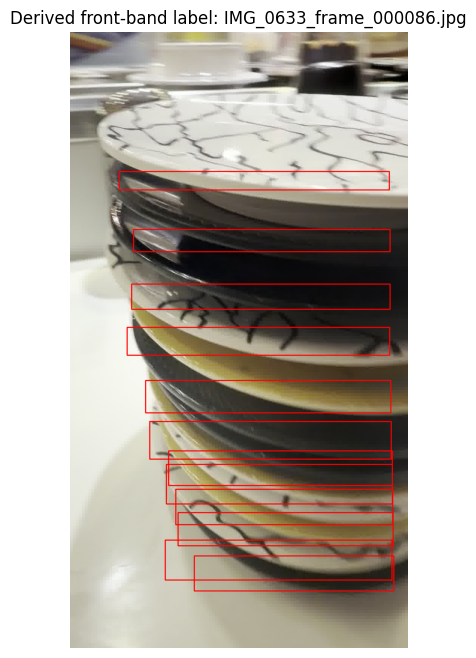

In [9]:
# ============================================================
# CELL 6 — PREVIEW DERIVED FRONT-BAND LABELS
# ============================================================

import random
import matplotlib.pyplot as plt
import cv2

def draw_yolo_boxes(image_path, label_path):
    img = cv2.imread(str(image_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    if label_path.exists():
        lines = [x.strip() for x in label_path.read_text().splitlines() if x.strip()]

        for line in lines:
            cls, xc, yc, bw, bh = line.split()
            xc, yc, bw, bh = map(float, [xc, yc, bw, bh])

            x1 = int((xc - bw / 2) * w)
            y1 = int((yc - bh / 2) * h)
            x2 = int((xc + bw / 2) * w)
            y2 = int((yc + bh / 2) * h)

            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

    return img

sample_imgs = list((OUT_DET / "images/train").glob("*"))
sample_imgs = random.sample(sample_imgs, min(12, len(sample_imgs)))

for img_path in sample_imgs:
    lbl_path = OUT_DET / "labels/train" / f"{img_path.stem}.txt"
    drawn = draw_yolo_boxes(img_path, lbl_path)

    plt.figure(figsize=(8, 8))
    plt.imshow(drawn)
    plt.title(f"Derived front-band label: {img_path.name}")
    plt.axis("off")
    plt.show()

In [10]:
# ============================================================
# CELL 7 — TRAIN IMPROVED DERIVED FRONT-BAND DETECTOR
# ============================================================

from ultralytics import YOLO
import torch

if not torch.cuda.is_available():
    raise RuntimeError("No GPU detected.")

model = YOLO("yolo11s.pt")

results = model.train(
    data=str(OUT_DET / "data.yaml"),
    task="detect",

    epochs=260,
    imgsz=960,
    batch=-1,
    patience=90,
    device=0,
    workers=2,

    project=str(RUNS_DIR),
    name="rim_yolo11s_FRONTBAND_ARC_CROP_V2",
    exist_ok=True,

    pretrained=True,

    # Gentle augmentation because rim geometry is fragile.
    close_mosaic=80,
    degrees=1.0,
    translate=0.025,
    scale=0.12,
    shear=0.2,
    perspective=0.00005,
    fliplr=0.5,
    flipud=0.0,
    mosaic=0.02,
    mixup=0.0,
    copy_paste=0.0,
    erasing=0.0,

    cos_lr=True,
    lr0=0.0010,
    weight_decay=0.0005,
    optimizer="auto",

    seed=42,
    deterministic=False,
)

Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=80, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/sushi_yolo_frontband_arc_crop_v2/data.yaml, degrees=1.0, deterministic=False, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=260, erasing=0.0, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=0.02, multi_scale=0.0, name=rim_yolo11s_FRONTBAND_ARC_CROP_V2, nbs=64, nms=False, opset=None, optimize=False,

In [11]:
# ============================================================
# CELL 8 — LOAD FRONTBAND ARC CROP V2 MODEL
# ============================================================

from ultralytics import YOLO
from pathlib import Path
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from IPython.display import Image, display

BASE = Path("/content/drive/MyDrive/NUS-MTech/ISYS5004/PracticeProject")
RUNS_DIR = BASE / "runs"
REPORT_DIR = BASE / "report_assets"
REPORT_DIR.mkdir(parents=True, exist_ok=True)

BEST_DET = RUNS_DIR / "rim_yolo11s_FRONTBAND_ARC_CROP_V2" / "weights" / "best.pt"

print("BEST_DET:", BEST_DET)
print("Exists:", BEST_DET.exists())

if not BEST_DET.exists():
    raise RuntimeError("V2 front-band model not found.")

model = YOLO(str(BEST_DET))

metrics = model.val(
    data=str(OUT_DET / "data.yaml"),
    task="detect",
    imgsz=960,
    device=0,
    split="val",
)

print(metrics)

val_images = sorted((OUT_DET / "images/val").glob("*"))
print("Validation images:", len(val_images))

# Candidate generation: generous
CAND_CONF = 0.005
FINAL_IOU = 0.20

# Clean final selection: count only real detections
CLEAN_SCORE_FLOOR = 0.08
CLEAN_MIN_Y_SEP_FACTOR = 0.35

print("CAND_CONF:", CAND_CONF)
print("FINAL_IOU:", FINAL_IOU)
print("CLEAN_SCORE_FLOOR:", CLEAN_SCORE_FLOOR)
print("CLEAN_MIN_Y_SEP_FACTOR:", CLEAN_MIN_Y_SEP_FACTOR)

BEST_DET: /content/drive/MyDrive/NUS-MTech/ISYS5004/PracticeProject/runs/rim_yolo11s_FRONTBAND_ARC_CROP_V2/weights/best.pt
Exists: True
Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 101 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2872.2±207.9 MB/s, size: 237.2 KB)
val: Scanning /content/sushi_yolo_frontband_arc_crop_v2/labels/val.cache... 8 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 8/8 2.8Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.9it/s 0.5s
                   all          8         64      0.919      0.844      0.887       0.54
Speed: 7.1ms preprocess, 27.2ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /content/runs/detect/val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metri

In [12]:
# ============================================================
# CELL 9 — MULTI-STACK-SAFE DETECTION UTILITIES
# ============================================================

def box_w(box):
    return max(1.0, float(box[2] - box[0]))

def box_h(box):
    return max(1.0, float(box[3] - box[1]))

def centre_x(box):
    return float((box[0] + box[2]) / 2)

def centre_y(box):
    return float((box[1] + box[3]) / 2)

def aspect_ratio(box):
    return box_w(box) / box_h(box)

def x_overlap_ratio(a, b):
    """
    Horizontal overlap ratio relative to smaller box width.
    Used to avoid suppressing different stacks at similar y-levels.
    """
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b

    inter = max(0.0, min(ax2, bx2) - max(ax1, bx1))
    denom = max(1.0, min(box_w(a), box_w(b)))

    return inter / denom

def box_iou(a, b):
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b

    ix1 = max(ax1, bx1)
    iy1 = max(ay1, by1)
    ix2 = min(ax2, bx2)
    iy2 = min(ay2, by2)

    iw = max(0.0, ix2 - ix1)
    ih = max(0.0, iy2 - iy1)

    inter = iw * ih
    area_a = max(0.0, ax2 - ax1) * max(0.0, ay2 - ay1)
    area_b = max(0.0, bx2 - bx1) * max(0.0, by2 - by1)

    return inter / (area_a + area_b - inter + 1e-9)

def gt_count_for_val_image(image_path):
    gt_label = OUT_DET / "labels/val" / f"{Path(image_path).stem}.txt"
    return len([x for x in gt_label.read_text().splitlines() if x.strip()])

def generate_frontband_candidates(
    model,
    image_path,
    conf=CAND_CONF,
    iou=FINAL_IOU,
    max_det=220,
):
    """
    Generate candidate front-band rim boxes.

    This does NOT assume single-stack.
    It only filters obvious non-rim shapes.
    """
    img = cv2.imread(str(image_path))
    if img is None:
        raise RuntimeError(f"Cannot read image: {image_path}")

    h, w = img.shape[:2]

    r = model.predict(
        source=str(image_path),
        imgsz=960,
        conf=conf,
        iou=iou,
        save=False,
        verbose=False,
        device=0,
        augment=True,
        max_det=max_det,
    )[0]

    if r.boxes is None or len(r.boxes) == 0:
        return np.empty((0, 4)), np.empty((0,))

    boxes = r.boxes.xyxy.cpu().numpy().reshape(-1, 4)
    scores = r.boxes.conf.cpu().numpy().reshape(-1)

    kept_boxes = []
    kept_scores = []

    for box, score in zip(boxes, scores):
        ar = aspect_ratio(box)
        rel_w = box_w(box) / w
        rel_h = box_h(box) / h
        cy = centre_y(box) / h

        if score < conf:
            continue

        # Rim bands should usually be horizontal.
        if not (1.6 <= ar <= 300.0):
            continue

        # Do not require huge width; smaller side-stack rims should survive.
        if not (0.035 <= rel_w <= 1.00):
            continue

        # Thin front-band target.
        if not (0.002 <= rel_h <= 0.22):
            continue

        # Avoid absolute border junk.
        if not (0.02 <= cy <= 0.98):
            continue

        kept_boxes.append(box)
        kept_scores.append(score)

    if len(kept_boxes) == 0:
        return np.empty((0, 4)), np.empty((0,))

    return np.asarray(kept_boxes), np.asarray(kept_scores)

def candidate_quality_score(box, score, img_w):
    """
    Ranking score. Keep confidence dominant.
    Width bonus is capped so wide left-stack boxes do not unfairly dominate.
    """
    rel_w = box_w(box) / img_w
    ar = aspect_ratio(box)

    width_bonus = min(rel_w, 0.60)
    ar_bonus = min(ar / 25.0, 1.0)

    return float(score) + 0.12 * width_bonus + 0.06 * ar_bonus

def select_clean_detected_bands(
    boxes,
    scores,
    image_path,
    score_floor=CLEAN_SCORE_FLOOR,
    y_close_factor=0.45,
    x_overlap_thr=0.50,
    iou_thr=0.45,
):
    """
    Multi-stack-safe clean selection.

    Removes duplicate detections only when:
    - same/near y-level AND strong x-overlap, OR
    - high IoU.

    This avoids suppressing two different stacks that happen to have rims at similar y-levels.
    """
    boxes = np.asarray(boxes, dtype=float).reshape(-1, 4)
    scores = np.asarray(scores, dtype=float).reshape(-1)

    if len(boxes) == 0:
        return boxes, scores

    img = cv2.imread(str(image_path))
    img_h, img_w = img.shape[:2]

    keep = scores >= score_floor
    boxes = boxes[keep]
    scores = scores[keep]

    if len(boxes) == 0:
        return boxes, scores

    q = np.array([
        candidate_quality_score(b, s, img_w)
        for b, s in zip(boxes, scores)
    ])

    order = np.argsort(-q)

    heights = np.array([box_h(b) for b in boxes])
    med_h = float(np.median(heights)) if len(heights) else 10.0
    y_close_px = max(4.0, med_h * y_close_factor)

    selected = []

    for idx in order:
        b = boxes[idx]
        y = centre_y(b)

        duplicate = False

        for kept_idx in selected:
            kb = boxes[kept_idx]

            same_y = abs(y - centre_y(kb)) < y_close_px
            strong_x_overlap = x_overlap_ratio(b, kb) > x_overlap_thr
            high_iou = box_iou(b, kb) > iou_thr

            # Only suppress if genuinely duplicate, not just same row in another stack.
            if high_iou or (same_y and strong_x_overlap):
                duplicate = True
                break

        if not duplicate:
            selected.append(idx)

    selected = sorted(selected, key=lambda i: (centre_y(boxes[i]), centre_x(boxes[i])))

    return boxes[selected], scores[selected]

def canonicalise_frontband_boxes(
    selected_boxes,
    image_path,
    width_scale=1.08,
    height_scale=1.15,
    min_h_px=8,
):
    """
    Multi-stack-safe canonicalisation.

    Important:
    - Does NOT use global median x.
    - Each box keeps its own x-centre and width.
    - This avoids dragging multiple stacks into one fake central stack.
    """
    boxes = np.asarray(selected_boxes, dtype=float).reshape(-1, 4)

    if len(boxes) == 0:
        return boxes

    img = cv2.imread(str(image_path))
    h, w = img.shape[:2]

    clean_boxes = []

    for b in boxes:
        cx = centre_x(b)
        cy = centre_y(b)

        target_w = box_w(b) * width_scale
        target_h = max(min_h_px, box_h(b) * height_scale)

        x1 = max(0, int(cx - target_w / 2))
        x2 = min(w, int(cx + target_w / 2))
        y1 = max(0, int(cy - target_h / 2))
        y2 = min(h, int(cy + target_h / 2))

        clean_boxes.append([x1, y1, x2, y2])

    return np.asarray(clean_boxes, dtype=float)

,image,gt_count,pred_count,error,abs_error,candidate_count,out_path
1,IMG_0630_frame_000075.jpg,12,12,0,0,15,/content/drive/MyDrive/NUS-MTech/ISYS5004/Prac...
2,IMG_0631_frame_000002.jpg,12,12,0,0,14,/content/drive/MyDrive/NUS-MTech/ISYS5004/Prac...
3,IMG_0638_frame_000167.jpg,12,12,0,0,17,/content/drive/MyDrive/NUS-MTech/ISYS5004/Prac...
4,IMG_0700_frame_000072.jpg,6,6,0,0,7,/content/drive/MyDrive/NUS-MTech/ISYS5004/Prac...
5,IMG_0701_frame_000020.jpg,6,6,0,0,6,/content/drive/MyDrive/NUS-MTech/ISYS5004/Prac...
6,IMG_0701_frame_000053.jpg,6,6,0,0,7,/content/drive/MyDrive/NUS-MTech/ISYS5004/Prac...
7,IMG_0702_frame_000057.jpg,6,6,0,0,9,/content/drive/MyDrive/NUS-MTech/ISYS5004/Prac...
0,IMG_0309_frame_000031.jpg,4,3,-1,1,5,/content/drive/MyDrive/NUS-MTech/ISYS5004/Prac...


V2 multi-stack-safe outputs:


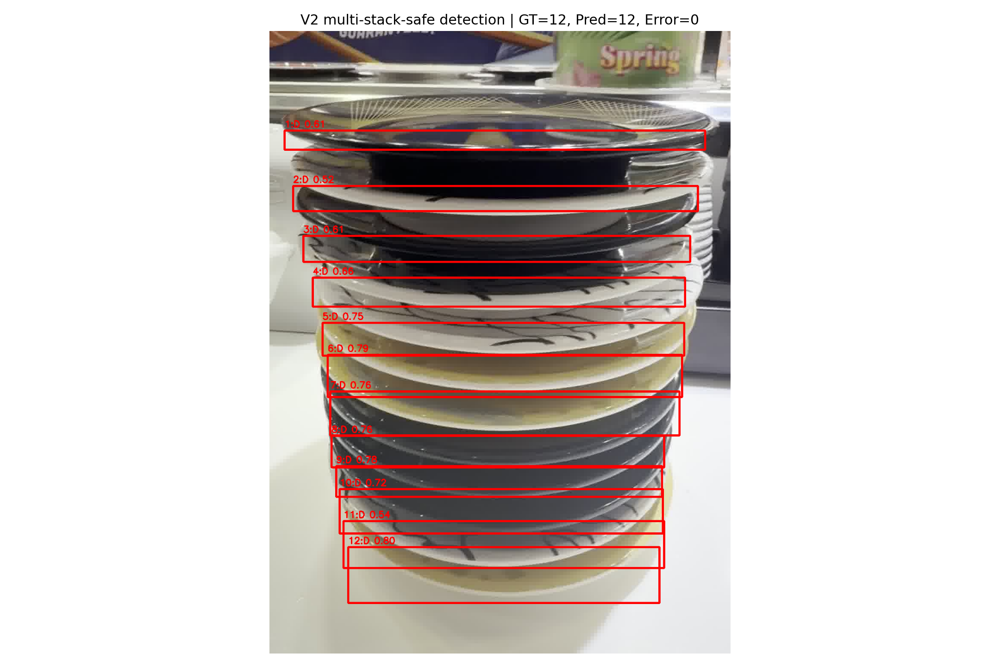

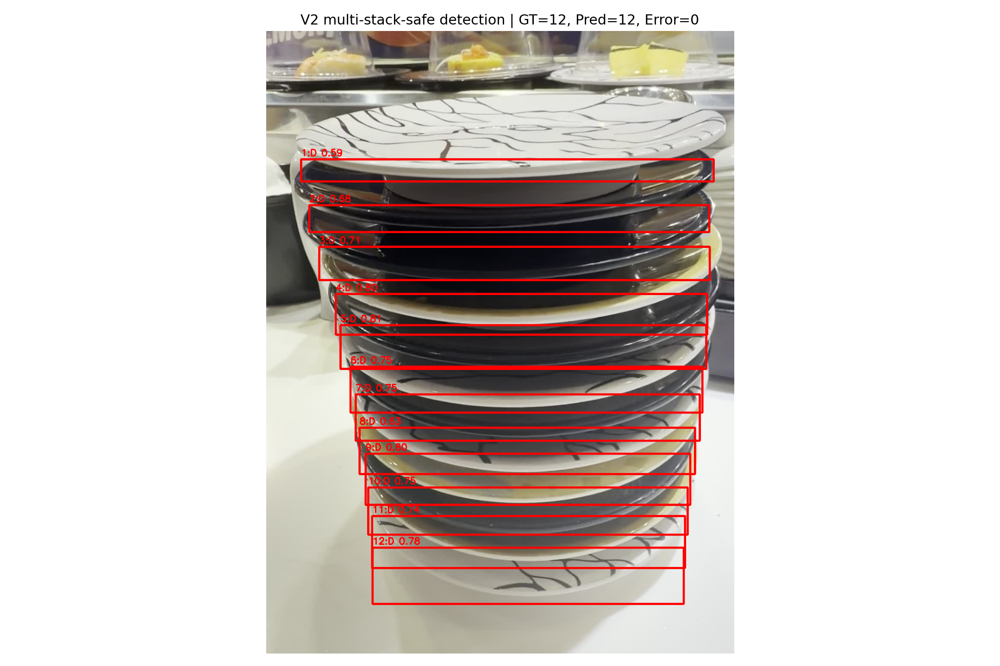

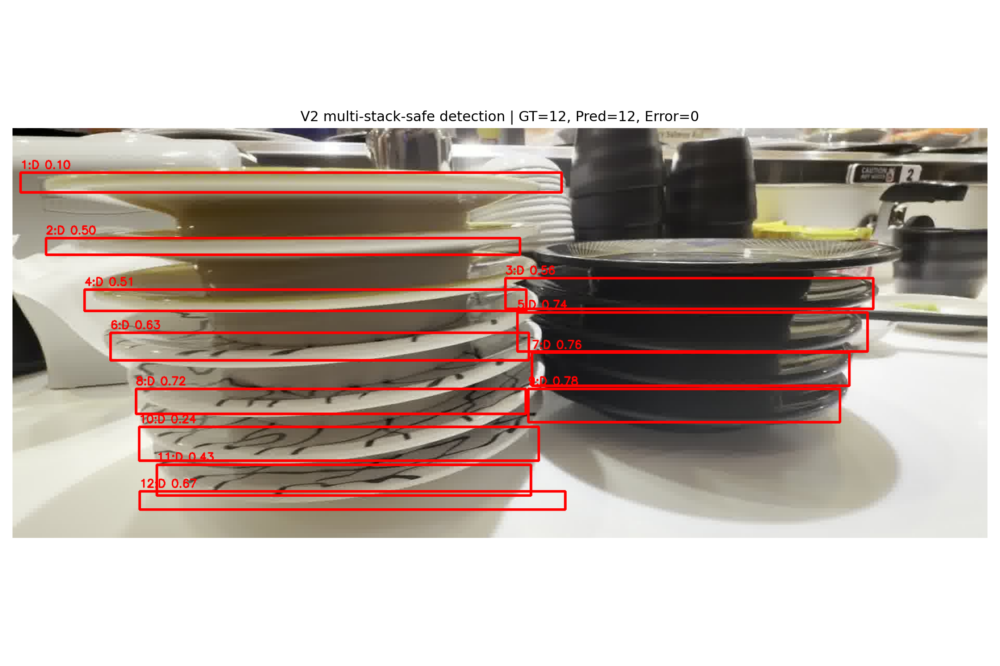

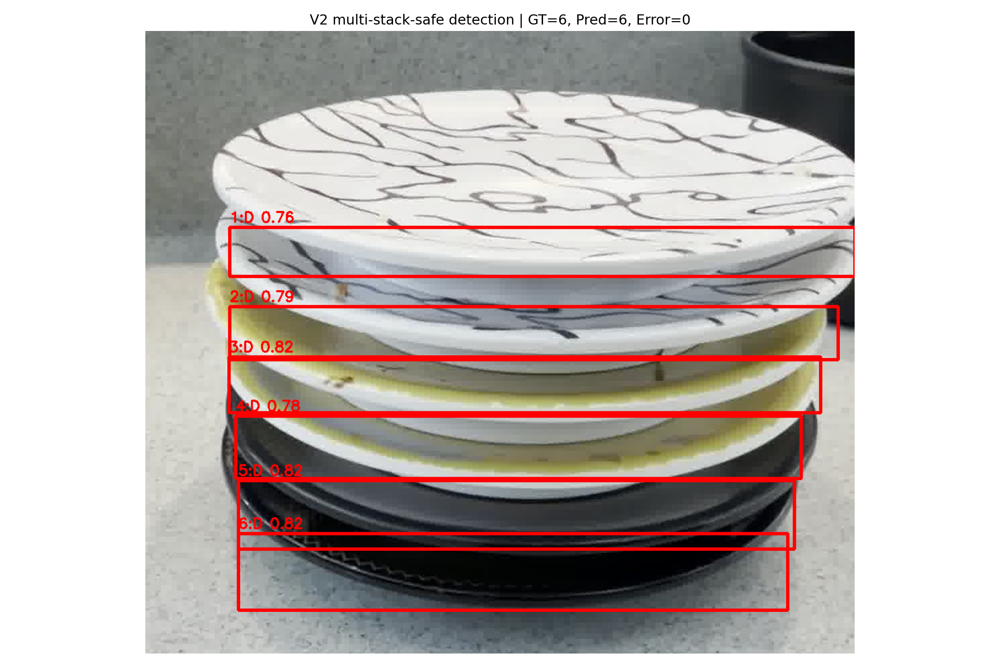

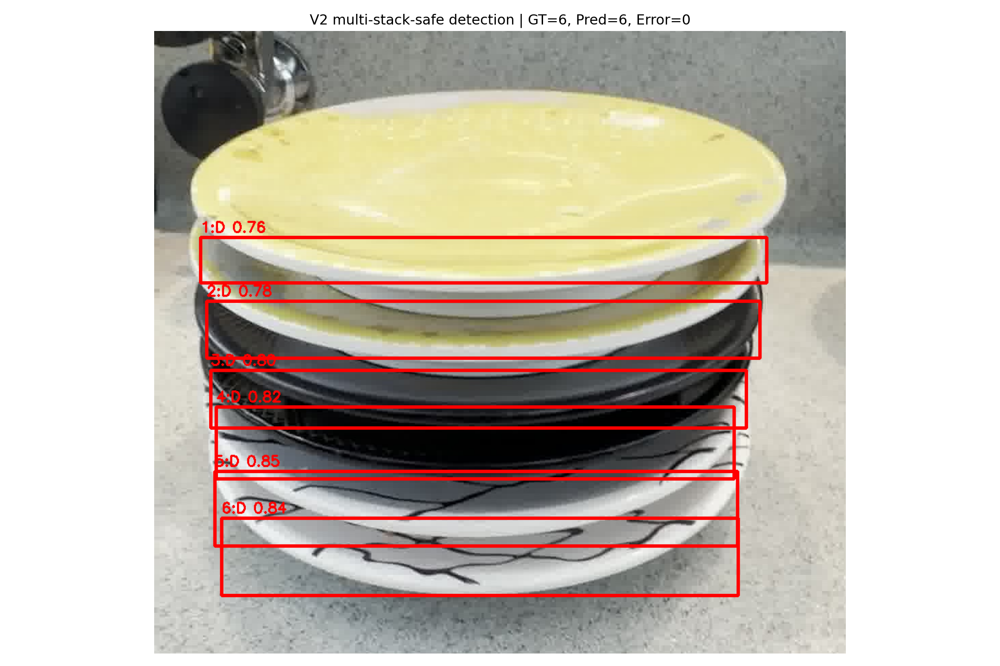

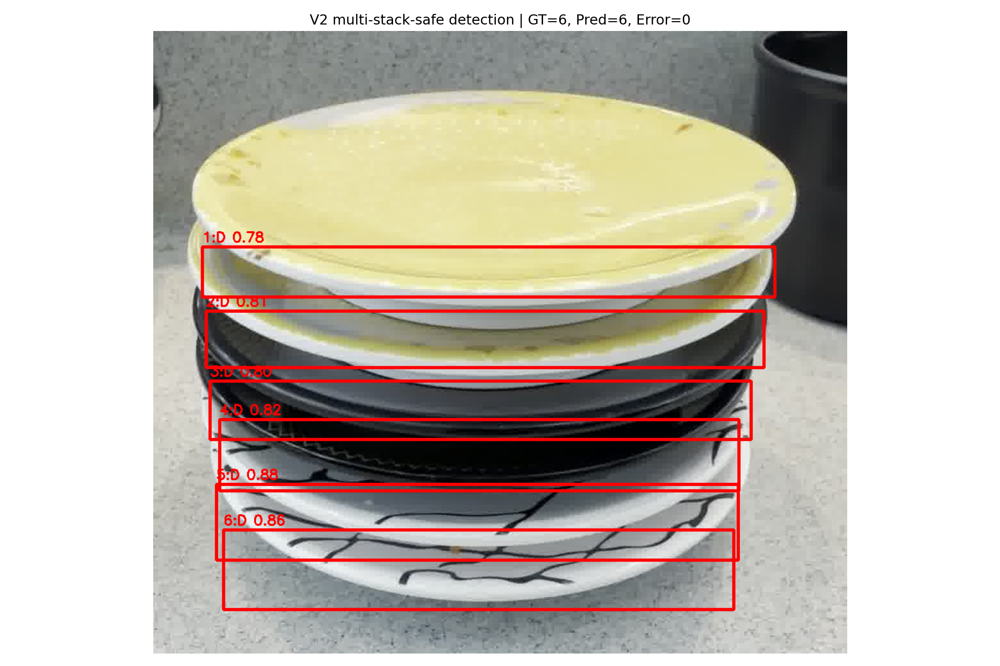

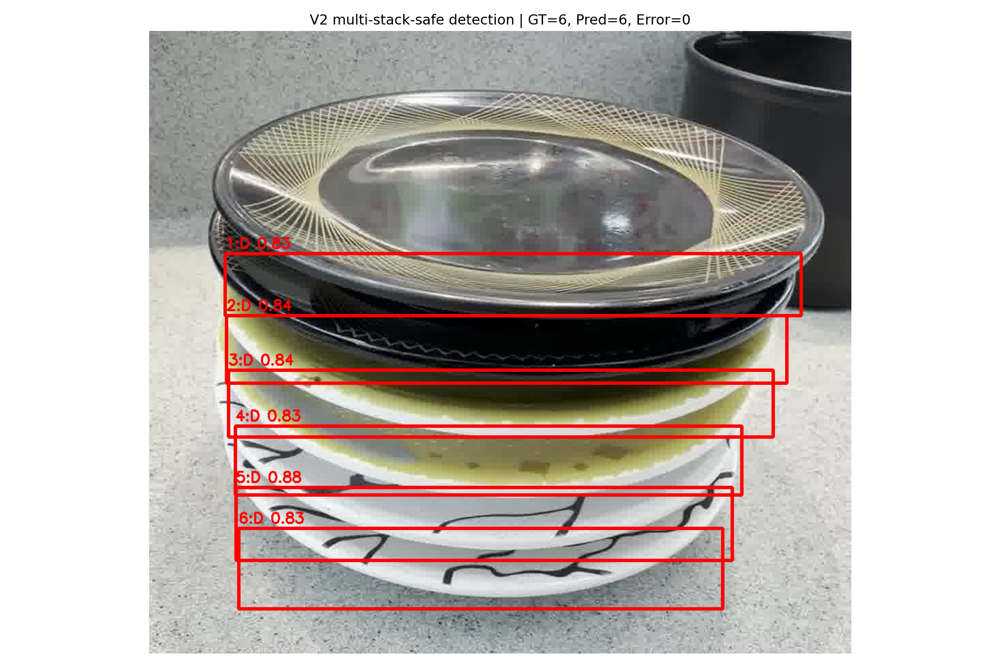

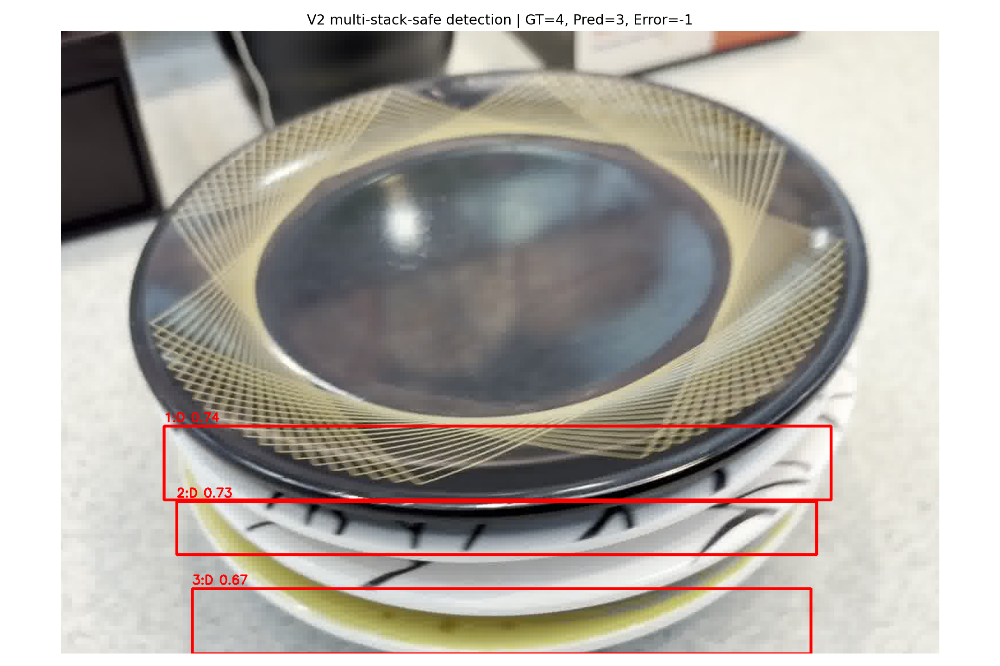

Worst cases:


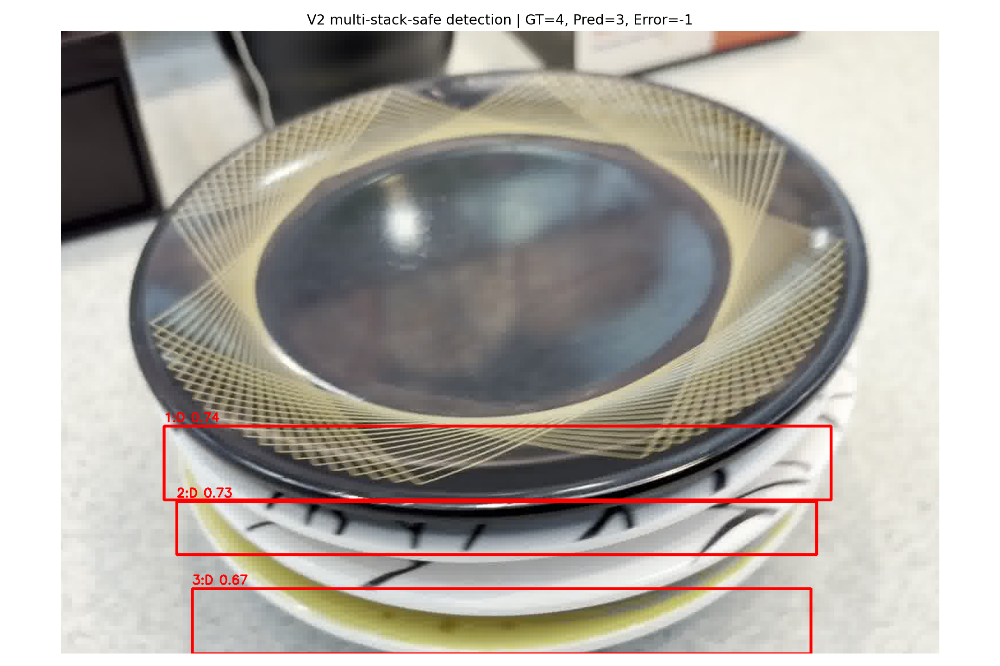

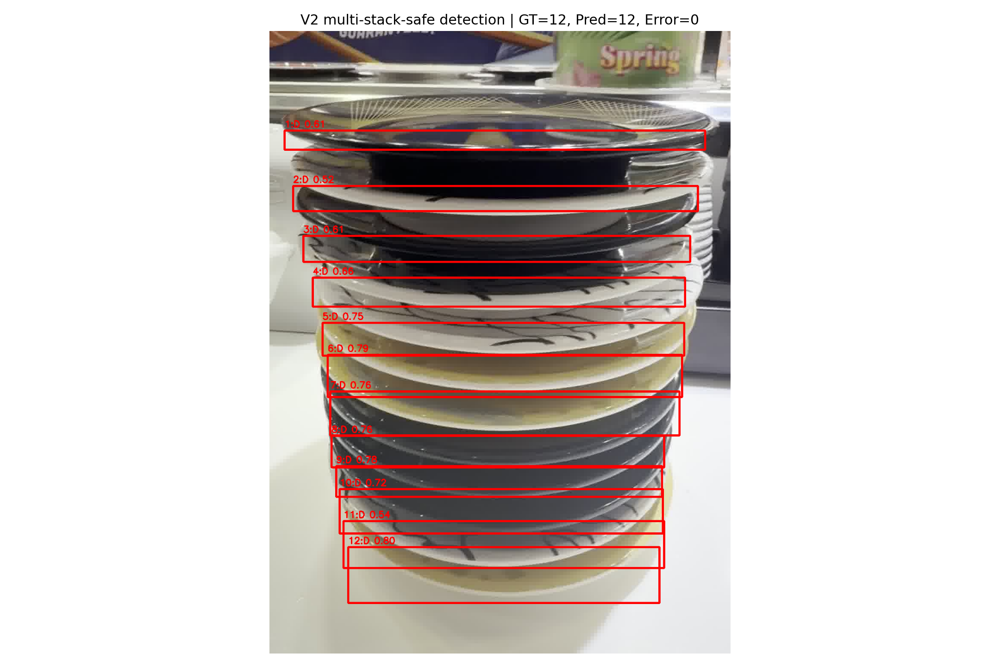

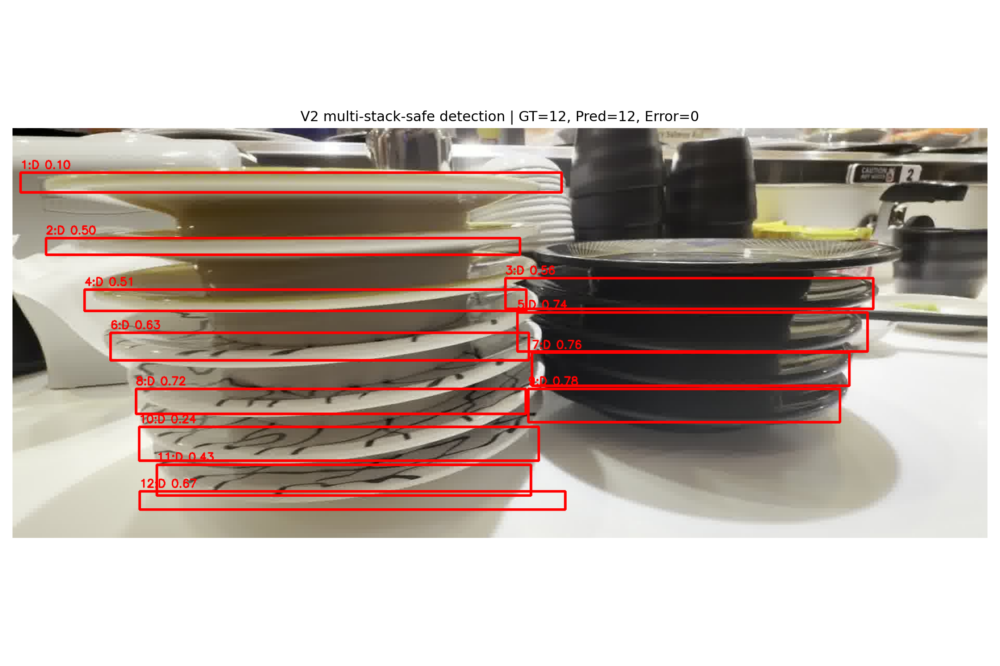

In [13]:
# ============================================================
# CELL 10 — EVALUATE MULTI-STACK-SAFE CLEAN DETECTION
# ============================================================

V2_SAFE_DIR = REPORT_DIR / "frontband_arc_v2_multistack_safe_outputs"
V2_SAFE_DIR.mkdir(parents=True, exist_ok=True)

def draw_multistack_safe_detection_result(model, image_path, out_path):
    img_bgr = cv2.imread(str(image_path))
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    cand_boxes, cand_scores = generate_frontband_candidates(
        model,
        image_path,
        conf=CAND_CONF,
        iou=FINAL_IOU,
        max_det=220,
    )

    final_boxes, final_scores = select_clean_detected_bands(
        cand_boxes,
        cand_scores,
        image_path=image_path,
        score_floor=CLEAN_SCORE_FLOOR,
        y_close_factor=0.45,
        x_overlap_thr=0.50,
        iou_thr=0.45,
    )

    display_boxes = canonicalise_frontband_boxes(
        final_boxes,
        image_path=image_path,
        width_scale=1.08,
        height_scale=1.15,
    )

    gt_count = gt_count_for_val_image(image_path)
    pred_count = len(display_boxes)
    error = pred_count - gt_count

    drawn = img_rgb.copy()

    for rank, (box, score) in enumerate(zip(display_boxes, final_scores), start=1):
        x1, y1, x2, y2 = [int(v) for v in box.tolist()]

        cv2.rectangle(drawn, (x1, y1), (x2, y2), (255, 0, 0), 3)
        cv2.putText(
            drawn,
            f"{rank}:D {score:.2f}",
            (x1, max(25, y1 - 8)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.70,
            (255, 0, 0),
            2,
        )

    title = f"V2 multi-stack-safe detection | GT={gt_count}, Pred={pred_count}, Error={error}"

    plt.figure(figsize=(12, 8))
    plt.imshow(drawn)
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig(out_path, dpi=180)
    plt.close()

    return {
        "image": Path(image_path).name,
        "gt_count": gt_count,
        "pred_count": pred_count,
        "error": error,
        "abs_error": abs(error),
        "candidate_count": len(cand_boxes),
        "out_path": str(out_path),
    }

rows = []

for img_path in val_images:
    out_path = V2_SAFE_DIR / f"v2_safe_{img_path.stem}.png"

    row = draw_multistack_safe_detection_result(
        model,
        img_path,
        out_path=out_path,
    )

    rows.append(row)

df_v2_safe = pd.DataFrame(rows)
df_v2_safe = df_v2_safe.sort_values(["abs_error", "gt_count"], ascending=[True, False])

display(df_v2_safe)

df_v2_safe.to_csv(REPORT_DIR / "frontband_arc_v2_multistack_safe_results.csv", index=False)

print("V2 multi-stack-safe outputs:")
for p in df_v2_safe["out_path"].head(8):
    display(Image(filename=p, width=900))

print("Worst cases:")
for p in df_v2_safe.sort_values("abs_error", ascending=False)["out_path"].head(3):
    display(Image(filename=p, width=900))